<a href="https://colab.research.google.com/github/calisolo/Levels_image_captioning_NICE/blob/master/NICE_quickstart.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content

!git clone https://github.com/calisolo/Levels_image_captioning_NICE/
!git clone https://huggingface.co/calisolo/OFA_huge_NICE_captioning

%cd ./Levels_image_captioning_NICE

/content
Cloning into 'Levels_image_captioning_NICE'...
remote: Enumerating objects: 516, done.
remote: Counting objects: 100% (206/206), done.
remote: Compressing objects: 100% (134/134), done.
remote: Total 516 (delta 102), reused 143 (delta 51), pack-reused 310
Receiving objects: 100% (516/516), 24.99 MiB | 17.34 MiB/s, done.
Resolving deltas: 100% (218/218), done.
Cloning into 'OFA_huge_NICE_captioning'...
remote: Enumerating objects: 29, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 29 (delta 9), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (29/29), 568.48 KiB | 6.39 MiB/s, done.
Filtering content: 100% (4/4), 4.39 GiB | 40.68 MiB/s, done.
/content/Levels_image_captioning_NICE


In [3]:
!pip install transformers==4.20.0
!pip install loguru
!pip install pycocoevalcap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 62.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 28.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 100.2 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 5.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 8.7 MB/s eta 0:00:00


In [4]:
import pandas as pd

In [5]:
val_set = pd.read_csv(f'data/nice-val-5k.csv')
inference_model = '/content/OFA_huge_NICE_captioning'
cosine = pd.read_csv('./data/encoder/test_fully_parsed_final_2.csv')

In [6]:
val_dict = {}
for index, i in enumerate(val_set['public_id']):
  val_dict[i] = val_set['caption_gt'][index]

In [7]:
#making Levels hint

import ast
caption_result = {}

for index, public_id in enumerate(cosine['0']):
  processed_data = ''
  processed_data = cosine['cos1'][index] + cosine['diff1'][index] + cosine['cat1'][index]+ val_dict[cosine['key1'][index]]
  processed_data += cosine['cos2'][index] + cosine['diff2'][index] + cosine['cat2'][index]+val_dict[cosine['key2'][index]]
  processed_data += cosine['cos3'][index] + cosine['diff3'][index] + cosine['cat3'][index]+val_dict[cosine['key3'][index]]
  processed_data += cosine['cos4'][index] + cosine['diff4'][index] + cosine['cat4'][index]+val_dict[cosine['key4'][index]]
  processed_data += '[shot_style]'

  
  shotlist = ast.literal_eval(cosine['shots'][index])
  locationlist = ast.literal_eval(cosine['locations'][index])
  if shotlist == []:
    processed_data += '[NULL]'
  else:
    for shot in shotlist:
      processed_data += shot + ' | '
  processed_data += '[Location]'
  if locationlist == []:
    processed_data += '[NULL]'
  else:
    for location in locationlist:
      processed_data += location + ' | '
  caption_result[str(public_id)] = processed_data
  
for i in caption_result: # how hint looks like
  print(caption_result[i])
  break

[cosHint lv1][diffHint lv1][outdoors]Young Couples Sitting On Grass With Arms In The Air[cosHint lv1][diffHint lv1][misc]Four young friends relaxing on sandy beach and taking a photo together[cosHint lv1][diffHint lv1][outdoors]Low angle view of man playing guitar at park[cosHint lv1][diffHint lv1][office]bartender Serving young women Pints Of Beer In the Bar[shot_style]Close up | Close up of | [Location][NULL]


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


/content/OFA_huge_NICE_captioning
./vocab
<super: <class 'OFATokenizer'>, <OFATokenizer object>>


  0%|          | 0/21377 [00:00<?, ?it/s]

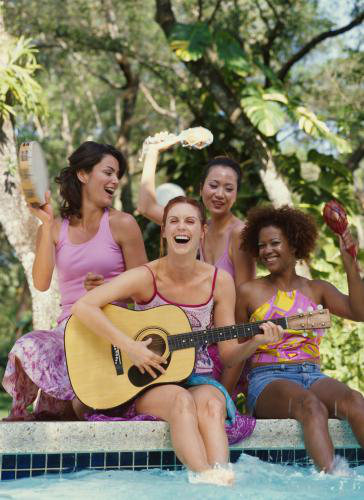

  0%|          | 1/21377 [00:11<68:45:42, 11.58s/it]

 what does the image describe?[cosHint lv1][diffHint lv1][outdoors]Young Couples Sitting On Grass With Arms In The Air[cosHint lv1][diffHint lv1][misc]Four young friends relaxing on sandy beach and taking a photo together[cosHint lv1][diffHint lv1][outdoors]Low angle view of man playing guitar at park[cosHint lv1][diffHint lv1][office]bartender Serving young women Pints Of Beer In the Bar[shot_style]Close up | Close up of | [Location][NULL]
['Group of young friends playing guitar at park']


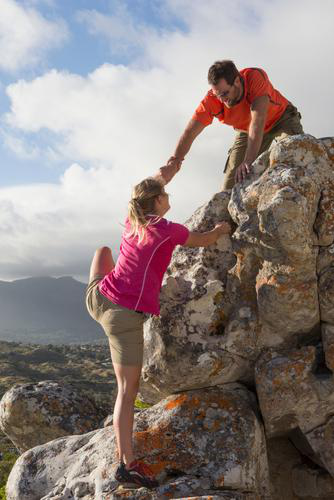

  0%|          | 2/21377 [00:12<30:54:10,  5.20s/it]

 what does the image describe?[cosHint lv3][diffHint lv2][outdoors]Wide shot of a male and female rock climber standing on top of a rock[cosHint lv3][diffHint lv2][outdoors]Vertical portrait of a male rock climber smiling at the camera[cosHint lv3][diffHint lv3][outdoors]Vertical shot of a male rock climber holding on to the edge of a rock[cosHint lv3][diffHint lv1][outdoors]View of a middle aged man rock climbing[shot_style]Close up shot of | Low angle vertical shot of | Wide shot of | Vertical shot of | [Location][NULL]
['Vertical shot of a male and female rock climber helping on the edge of a rock']


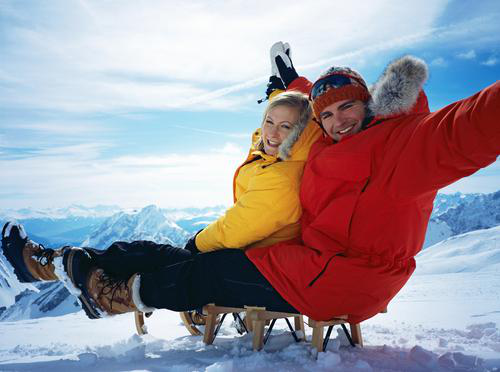

  0%|          | 3/21377 [00:12<18:23:16,  3.10s/it]

 what does the image describe?[cosHint lv3][diffHint lv1][outdoors]Children on sled in snow on mountain winter vacation at camera[cosHint lv3][diffHint lv1][outdoors]Senior couple in coats on winter day in the mountains[cosHint lv3][diffHint lv1][outdoors]Teenage boy on slope on skiing holiday Tirol Austria Europe[cosHint lv2][diffHint lv1][outdoors]Young woman with skis standing in mountains on winter day[shot_style]Low angle view of | [Location][NULL]
['Couple sitting on sled on mountain top smiling at camera']


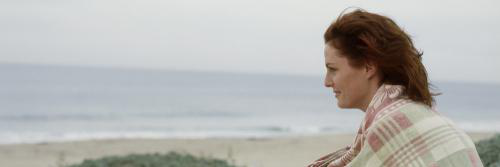

  0%|          | 4/21377 [00:13<12:40:01,  2.13s/it]

 what does the image describe?[cosHint lv2][diffHint lv1][outdoors]A woman holding a shell to her ear[cosHint lv2][diffHint lv1][outdoors]Wide shot of a female in swimwear walking on the beach with an equipment bucket[cosHint lv1][diffHint lv1][outdoors]Loving couple sitting and hugging on winter beach from behind[cosHint lv1][diffHint lv1][outdoors]Portrait of a serious looking man in a tropical garden[shot_style]Blurred view of | View of | View of | View of | [Location][diffHint lv2][outdoors]Cape Town South Africa | 
['View of a woman in a white bathrobe standing on a beach']


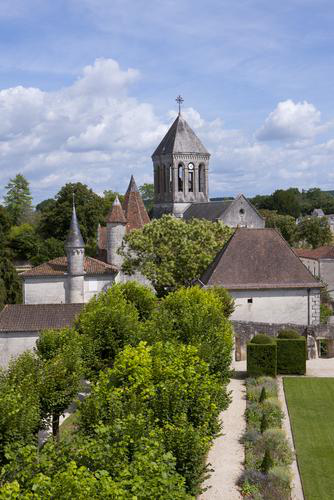

  0%|          | 5/21377 [00:14<9:54:31,  1.67s/it] 

 what does the image describe?[cosHint lv3][diffHint lv2][outdoors]Rooftops of idyllic village Bourdeilles Dordogne France[cosHint lv2][diffHint lv2][outdoors]Rooftops of idyllic village Bourdeilles Dordogne France[cosHint lv2][diffHint lv1][outdoors]View to Valdemossa Mallorca Spain[cosHint lv2][diffHint lv2][outdoors]View of town and bridge spanning river on sunny day Jarnac and the Charente river West Central France[shot_style]Close up of | [Location][diffHint lv2][outdoors]Alcazar Seville Spain | [diffHint lv2][outdoors]Seville Spain | 
['Rooftops of idyllic village Bourdeilles Dordogne France']


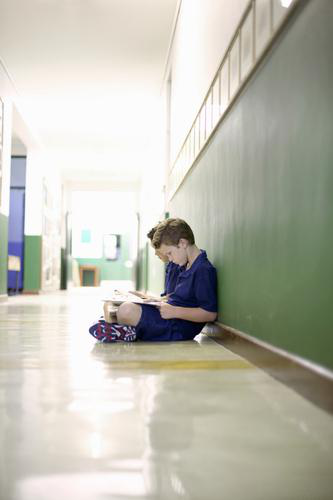

  0%|          | 6/21377 [00:15<7:44:50,  1.31s/it]

 what does the image describe?[cosHint lv1][diffHint lv1][indoors]High school girls assembling a robotic structure in a science class with a classmate watching them[cosHint lv1][diffHint lv2][indoors]View of young boy concentrating on writing[cosHint lv1][diffHint lv1][indoors]Female high school student drawing working at desk in art lesson[cosHint lv1][diffHint lv1][indoors]Wide shot of an art teacher watching middle school students paint during an art class[shot_style]Portrait of | Portrait of | [Location][NULL]
['View of young boy concentrating on writing']


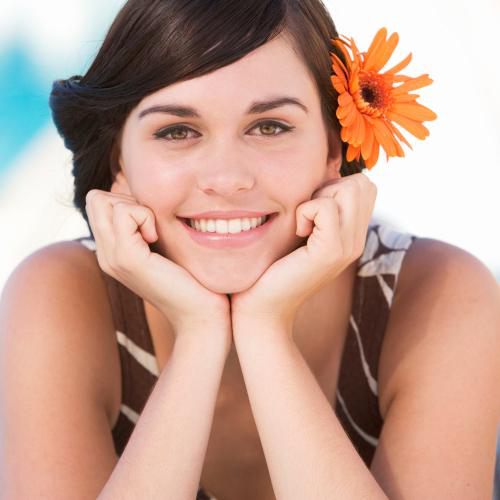

  0%|          | 7/21377 [00:15<6:01:43,  1.02s/it]

 what does the image describe?[cosHint lv2][diffHint lv1][indoors]A middle aged woman listening to mp3 music player[cosHint lv2][diffHint lv1][food]Young woman in underwear eating healthy apple snack[cosHint lv2][diffHint lv1][outdoors]Portrait of a young woman in the street carrying a shoulder bag[cosHint lv2][diffHint lv1][outdoors]Portrait of a smiling woman[shot_style][NULL][Location][NULL]
['A woman holding a flower']


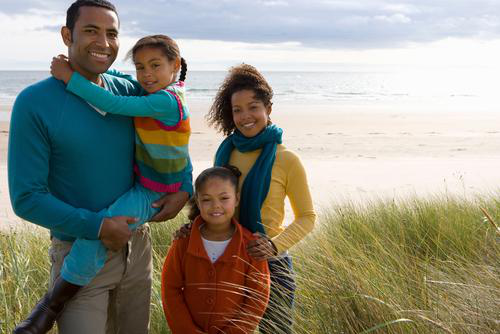

  0%|          | 8/21377 [00:16<5:58:46,  1.01s/it]

 what does the image describe?[cosHint lv3][diffHint lv1][outdoors]Medium shot of a happy couple standing at the shore of a sunny beach[cosHint lv2][diffHint lv1][outdoors]A small family of three sitting on a cold beach in front of tall grass while smiling at the camera[cosHint lv2][diffHint lv1][outdoors]Medium shot of a man carrying a woman on his back while walking along the shore of a sunny beach[cosHint lv2][diffHint lv3][misc]Little girl running into her father's open arms at the beach as her mother is watching from the background on an overcast windy day[shot_style]Close up of | Close up of | [Location][NULL]
["Little girl running into her father's open arms at the beach as her mother is watching from the background on an overcast windy day"]


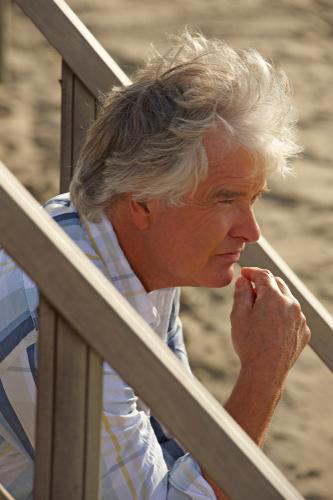

  0%|          | 9/21377 [00:16<5:08:45,  1.15it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][outdoors]Portrait of a senior woman[cosHint lv1][diffHint lv1][outdoors]Close up of senior woman smiling[cosHint lv1][diffHint lv1][outdoors]Portrait of a senior woman at the beach[cosHint lv1][diffHint lv1][outdoors]Portrait of a smiling senior woman in front of tropical foliage[shot_style][NULL][Location][diffHint lv2][outdoors]Trollstigen The Troll Path Rauma Norway | 
['Senior man leaning out of limousine window']


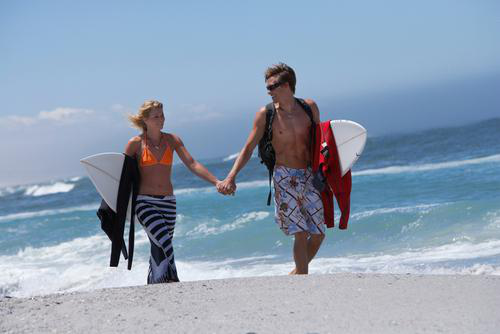

  0%|          | 10/21377 [00:17<5:02:22,  1.18it/s]

 what does the image describe?[cosHint lv4][diffHint lv1][misc]Horizontal shot of a father chasing his daughter in water at the beach on a sunny day[cosHint lv3][diffHint lv2][outdoors]Medium shot of the Backside of a group of friends in swimwear walking along the beach holding surfboards[cosHint lv3][diffHint lv1][outdoors]Wide shot of elderly couple holding hands and flying kite on a sunny beach[cosHint lv3][diffHint lv1][outdoors]Full length of a young happy couple carrying yellow surfboards on beach over sand dunes[shot_style]Wide shot of | Wide shot of | Medium shot of | Close up shot of | [Location][NULL]
['Full shot of the Backside of a group of friends in swimwear walking along the beach holding surfboards']


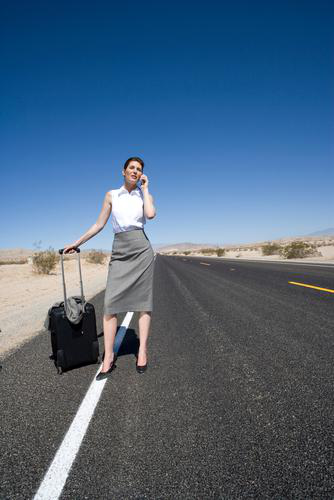

  0%|          | 11/21377 [00:18<4:49:48,  1.23it/s]

 what does the image describe?[cosHint lv4][diffHint lv3][office]Full length shot of a businesswoman with luggage on a road in the desert[cosHint lv4][diffHint lv2][electronics]Horizontal shot of a businessman sitting on a filing cabinet using a mobile phone in the middle of an open road in the desert[cosHint lv3][diffHint lv1][office]Vertical shot of a businessman with hands on hips on a yellow line in the middle of a road in the desert[cosHint lv2][diffHint lv1][misc]View of long open road at sunrise in arid landscape[shot_style]Full length shot of | Vertical portrait of | Low angle view of | Horizontal shot of | [Location][NULL]
['Full length shot of a businesswoman with luggage on a road in the desert']


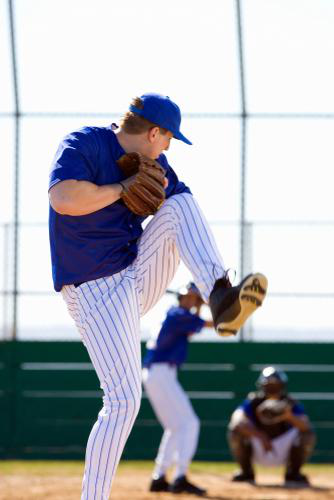

  0%|          | 12/21377 [00:18<4:08:02,  1.44it/s]

 what does the image describe?[cosHint lv2][diffHint lv1][outdoors]Young boy catching a baseball[cosHint lv1][diffHint lv1][misc]cutout of baseball team in blue uniforms celebrating[cosHint lv1][diffHint lv1][outdoors]Portrait boy with catcher's mitt[cosHint lv1][diffHint lv1][outdoors]Young boy being lifted up by baseball coach[shot_style]Portrait of | Portrait of | [Location][diffHint lv3][outdoors]Balboa Park | 
['Young boy catching a baseball']


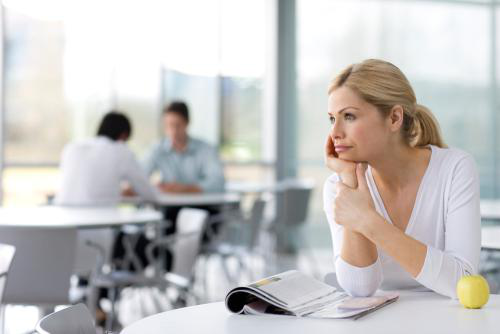

  0%|          | 13/21377 [00:19<3:57:56,  1.50it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][office]A horizontal view of two businessmen using a laptop while working in the conference room[cosHint lv3][diffHint lv1][electronics]A businessman in an office with two colleagues in background looking at laptop[cosHint lv3][diffHint lv1][indoors]A man and woman in formal business suit looking into a digital tablet while sitting at a table in the lobby[cosHint lv3][diffHint lv1][electronics]A medium shot of a businessman looking at a laptop while drinking coffee in airport lounge[shot_style][NULL][Location][NULL]
['Businesswoman at camera with office colleagues meeting in background']


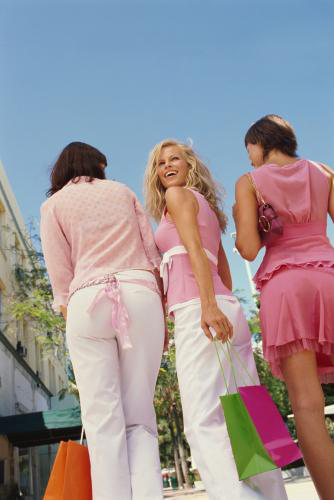

  0%|          | 14/21377 [00:20<3:39:03,  1.63it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][indoors]Portrait of teenage girls touching toes in gym[cosHint lv1][diffHint lv1][stocky_setting]Couple walking arm in arm carrying shopping bags[cosHint lv1][diffHint lv1][office]Portrait of group of businesswomen[cosHint lv1][diffHint lv1][outdoors]couple having fun in the park[shot_style]Close up | Close up of | [Location][NULL]
['Portrait of three teenage girls holding shopping bags']


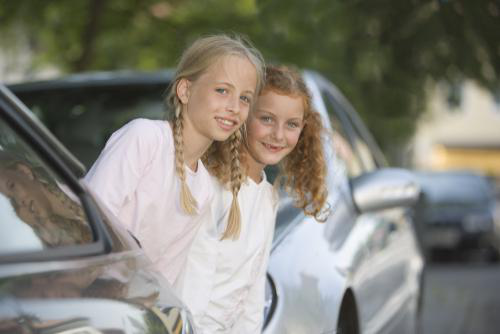

  0%|          | 15/21377 [00:20<3:25:29,  1.73it/s]

 what does the image describe?[cosHint lv2][diffHint lv1][office]Portrait of smiling woman lying on automobile hood in a car dealership showroom[cosHint lv1][diffHint lv1][outdoors]Close up of a woman spraying water on the bonnet to wash off the soap[cosHint lv1][diffHint lv1][misc]Wide shot of a beautiful woman checking the broken down automobile by opening the bonnet[cosHint lv1][diffHint lv1][outdoors]Retired senior couple driving convertible car with woman stretching arms in air[shot_style]Rear view of | [Location][NULL]
['Two young women standing beside a stretch limousine']


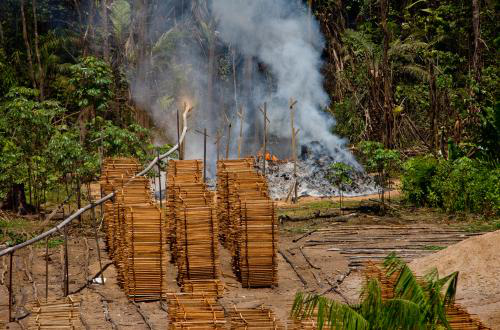

  0%|          | 16/21377 [00:21<3:40:15,  1.62it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][outdoors]Part of the Bora Village Rio Ampyacu Amazon River Peru[cosHint lv1][diffHint lv1][outdoors]View of a beach at Hacha falls Canaima National Park Venezuela[cosHint lv1][diffHint lv2][office]Lumber industry at Breves Channels Brazil[cosHint lv1][diffHint lv2][office]Lumber industry at Breves Channels Brazil[shot_style][NULL][Location][diffHint lv3][outdoors]Alter do Chao Rio Tapajos Amazon River Brazil | [diffHint lv2][outdoors]Breves Channels Brazil | [diffHint lv2][office]Breves Channels Brazil | [diffHint lv2][office]Breves Channels Brazil | [diffHint lv2][office]Breves Channels Brazil | [diffHint lv2][outdoors]Basilica Nossa Senhora de Nazare Belem Brazil | 
['Lumber industry at Breves Channels Brazil']


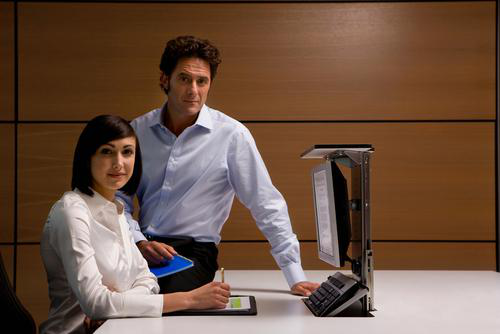

  0%|          | 17/21377 [00:21<3:49:52,  1.55it/s]

 what does the image describe?[cosHint lv4][diffHint lv1][office]Mature businessman working at computer in office[cosHint lv4][diffHint lv1][indoors]A medium shot of a happy businessman looking up while sitting in front of a computer with paperwork in office[cosHint lv3][diffHint lv3][indoors]A portrait shot of a businesswoman thinking while sitting at her desk in front of a computer[cosHint lv3][diffHint lv1][indoors]A vertical shot of a businessman and businesswoman talking at a desk in front of a computer in office[shot_style]A portrait shot of | A medium shot of | A medium shot of | A portrait shot of | [Location][NULL]
['A medium shot of a businessman and businesswoman smiling at camera while working together in front of a computer']


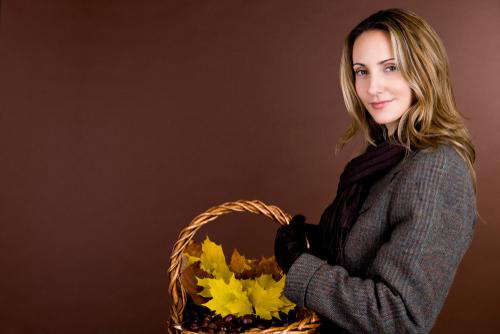

  0%|          | 18/21377 [00:22<3:29:09,  1.70it/s]

 what does the image describe?[cosHint lv2][diffHint lv2][indoors]A mid adult woman holding a pumpkin[cosHint lv2][diffHint lv2][indoors]A mid adult woman lifting a pumpkin[cosHint lv2][diffHint lv2][indoors]A mid adult woman holding a plate of clementines[cosHint lv2][diffHint lv2][indoors]A mid adult woman holding an apple[shot_style]Portrait of | [Location][NULL]
['A mid adult woman holding a basket full of autumn leaves']


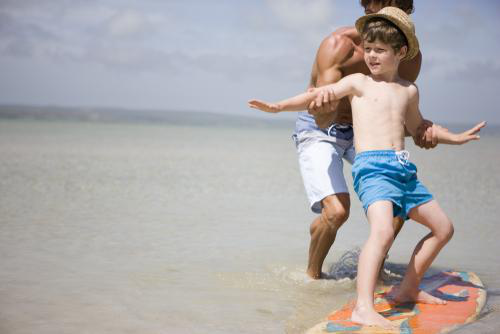

  0%|          | 19/21377 [00:22<3:09:33,  1.88it/s]

 what does the image describe?[cosHint lv2][diffHint lv3][outdoors]Family running together on beach[cosHint lv2][diffHint lv1][outdoors]Portrait of a mature woman in swimming cap by a friend in sunhat on the beach[cosHint lv2][diffHint lv2][outdoors]Family running together on beach[cosHint lv2][diffHint lv3][outdoors]Father and boys running on beach[shot_style]Close up of | [Location][NULL]
['Father and son running together on beach']


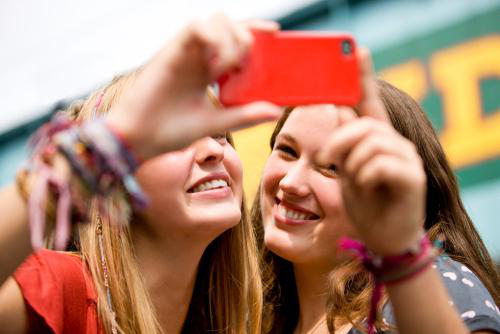

  0%|          | 20/21377 [00:23<3:09:44,  1.88it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][outdoors]Horizontal head and shoulder portrait of two jubilant young women outdoors with one smiling and holding a mobile phone[cosHint lv1][diffHint lv1][outdoors]Loving young couple taking selfie in desert[cosHint lv1][diffHint lv1][outdoors]Young happy girls looking at each other outdoors[cosHint lv1][diffHint lv1][electronics]Two young women on beach using mobile phone on summer vacation[shot_style]Studio beauty shot with | Detail of | [Location][NULL]
['Two young women taking selfies with their mobile phone']


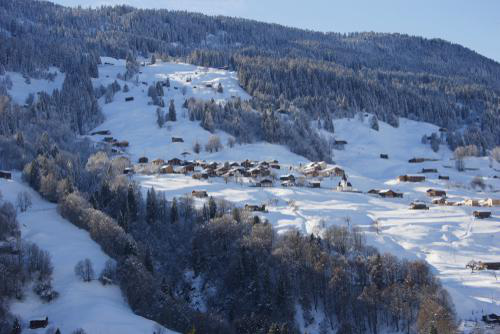

  0%|          | 21/21377 [00:24<3:24:05,  1.74it/s]

 what does the image describe?[cosHint lv3][diffHint lv2][outdoors]View from Luesener Alm Dolomite Alps Alps South Tyrol Italy[cosHint lv3][diffHint lv1][outdoors]High angle view of Klosters in winter Davos Grisons Switzerland[cosHint lv3][diffHint lv1][outdoors]Farm in snowy landscape Upper Bavaria Germany[cosHint lv3][diffHint lv1][outdoors]View to Doerflein z Mutt village Zmutt Zermatt Valais Switzerland Europe[shot_style]Close up of | View from | [Location][diffHint lv3][outdoors]Frauenkirch near Davos Grisons Switzerland | [diffHint lv3][outdoors]Wuerm River Wuerm Valley Bavaria Germany | [diffHint lv3][outdoors]Luesener Alm to Peitlerkofel Dolomite Alps South Tyrol Italy | [diffHint lv2][outdoors]Dolomite Alps South Tyrol Italy | 
['View over Luesener Alm Dolomite Alps Alps South Tyrol Italy']


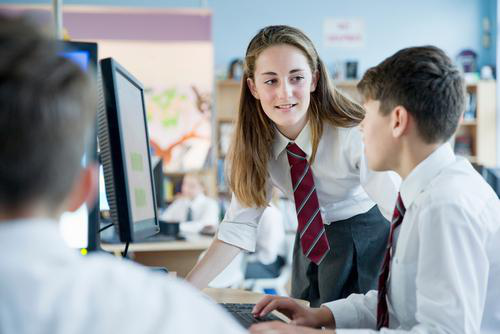

  0%|          | 22/21377 [00:24<4:07:16,  1.44it/s]

 what does the image describe?[cosHint lv4][diffHint lv3][misc]Focused schoolgirls in private school uniform sharing computer in the computer lab[cosHint lv3][diffHint lv3][misc]Portrait of a focused schoolgirl in a private school uniform studying at a computer in a computer lab[cosHint lv3][diffHint lv3][misc]Schoolgirl in private school uniform using computer in the computer lab[cosHint lv3][diffHint lv1][indoors]High school girls assembling a robotic structure in a science class with a classmate watching them[shot_style]Portrait of | Silhouetted reflection of | [Location][NULL]
['Focused schoolgirls in private school uniform sharing computer in the computer lab']


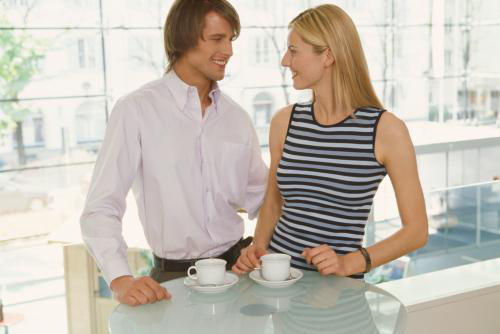

  0%|          | 23/21377 [00:25<4:04:31,  1.46it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][electronics]Businessman and businesswoman with digital tablet meeting in office smiling at camera[cosHint lv3][diffHint lv1][indoors]A portrait of a happy businesswoman and her co worker using a digital tablet while sitting at the table near a glass window[cosHint lv3][diffHint lv1][electronics]Smiling couple listening to a call at a cafe table[cosHint lv3][diffHint lv1][indoors]A man and woman in formal business suit looking into a digital tablet while sitting at a table in the lobby[shot_style][NULL][Location][NULL]
['Businessman and businesswoman with digital tablet meeting in office smiling at camera']


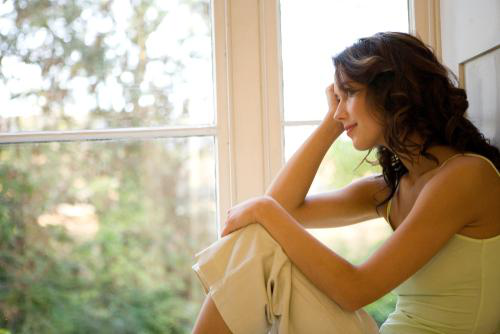

  0%|          | 24/21377 [00:26<3:44:11,  1.59it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][indoors]Portrait of a young woman[cosHint lv1][diffHint lv1][indoors]Portrait of a young woman[cosHint lv1][diffHint lv1][outdoors]Beauty portrait of a woman in a tropical setting touching the foliage[cosHint lv1][diffHint lv1][electronics]Outdoor portrait of smiling businesswoman with mobile phone[shot_style]Portrait of | [Location][NULL]
['Woman looking out of the window']


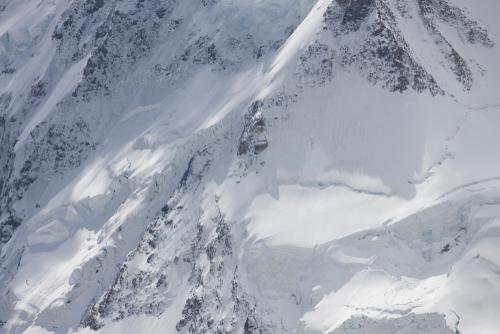

  0%|          | 25/21377 [00:26<3:45:11,  1.58it/s]

 what does the image describe?[cosHint lv3][diffHint lv3][outdoors]View from Gornercrest Zermatt Valais Switzerland Europe[cosHint lv3][diffHint lv1][outdoors]Snow covered mountains in the Austrian Alps at Flachauwinkl[cosHint lv3][diffHint lv1][outdoors]Snowy mountain range and blue sky[cosHint lv3][diffHint lv1][outdoors]Snow covered mountain under blue sky Sertig Valley Davos Graubuenden Grisons Switzerland[shot_style]View from | Detail of | View from | [Location][diffHint lv3][outdoors]Gornercrest Zermatt Valais Switzerland Europe | [diffHint lv3][outdoors]Matterhorn in the evening Zermatt Valais Switzerland Europe | [diffHint lv3][outdoors]Ruinaulta Canyon of the river Rhine Grisons Switzerland Europe | [diffHint lv2][outdoors]Gornercrest Zermatt Valais Switzerland Europe | [diffHint lv2][outdoors]Doerflein z Mutt village Zmutt Zermatt Valais Switzerland Europe | [diffHint lv2][outdoors]Alphorns Zermatt Valais Switzerland Europe | 
['View from Gornercrest Zermatt Valais Switzerlan

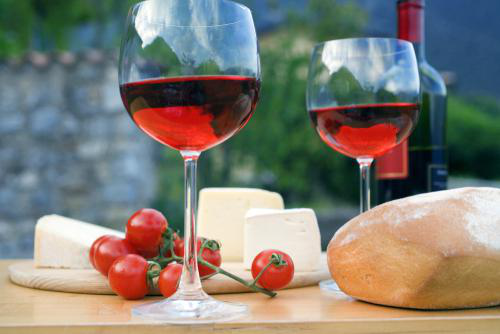

  0%|          | 26/21377 [00:27<3:33:02,  1.67it/s]

 what does the image describe?[cosHint lv2][diffHint lv2][outdoors]Low angle view of wine bottle and wine glass[cosHint lv2][diffHint lv2][food]Wine and cheese with pitcher on table outdoors[cosHint lv1][diffHint lv2][outdoors]Close up of grapes and wine on table outdoors[cosHint lv1][diffHint lv3][food]High angle view of wine cheese grapes tomatoes and bread[shot_style]High angle view of | Close up of | Close up of | [Location][NULL]
['Wine and cheese with pitcher on table outdoors']


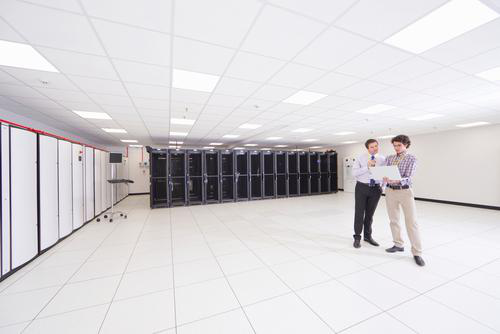

  0%|          | 27/21377 [00:27<3:36:28,  1.64it/s]

 what does the image describe?[cosHint lv4][diffHint lv3][electronics]Portrait shot of a technician using a laptop in a server room[cosHint lv2][diffHint lv2][electronics]Wide shot of a manager standing in the aisle of a data center aligned with storage cabinets[cosHint lv2][diffHint lv2][electronics]Full shot of a technician standing in the aisle of a server room and replacing servers in a cabinet[cosHint lv2][diffHint lv1][electronics]Close up Of a Technician With a Laptop standing In the Data Centre[shot_style]Portrait shot of | Silhouette shot of | Vertical silhouette shot of | [Location][NULL]
['Wide shot of a technician using a laptop in a server room']


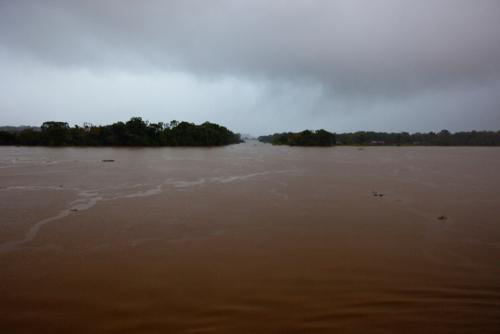

  0%|          | 28/21377 [00:28<3:27:05,  1.72it/s]

 what does the image describe?[cosHint lv3][diffHint lv3][outdoors]Amazon River near Panelas Brazil[cosHint lv3][diffHint lv2][outdoors]Aerial view of the confluence of the Rio Negro s water and the Solimoes River's water[cosHint lv3][diffHint lv1][outdoors]Riverside near Alter do Chao Rio Tapajos Amazon River Brazil[cosHint lv3][diffHint lv2][outdoors]Aerial view of the confluence of the Rio Negro s water and the Solimoes River's water[shot_style][NULL][Location][diffHint lv3][outdoors]Amazon River near Uara Brazil | [diffHint lv3][outdoors]Amazon River near Uara Brazil | [diffHint lv3][outdoors]Amazon River near Uara Brazil | [diffHint lv3][outdoors]Ochna serrulata Igapo forest Rio Jutai Brazil | [diffHint lv3][outdoors]Rio Jutai Brazil | [diffHint lv3][outdoors]Vespiary in Igapo forest Riverside of Rio Jutai Brazil | 
['Amazon River near Uara Brazil']


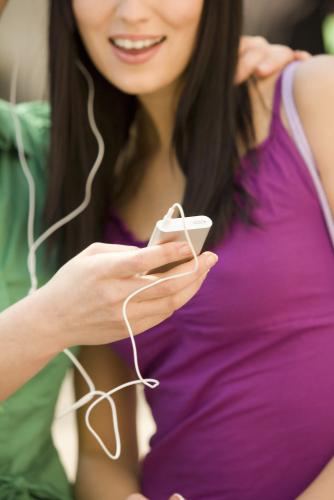

  0%|          | 29/21377 [00:29<3:36:04,  1.65it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][outdoors]Smiling young couple watching something on a digital tablet together[cosHint lv1][diffHint lv1][misc]A young girl using a mobile phone[cosHint lv1][diffHint lv1][outdoors]Young woman talking on a mobile phone[cosHint lv1][diffHint lv1][outdoors]Horizontal head and shoulder portrait of two jubilant young women outdoors with one smiling and holding a mobile phone[shot_style]View over  | [Location][diffHint lv3][outdoors]Anse Intendance Mahe Seychelles | [diffHint lv3][outdoors]Police Bay Mahe Seychelles | [diffHint lv2][outdoors]Anse A La Mouche Mahe Seychelles | [diffHint lv2][outdoors]Mahe Seychelles | 
['Woman listening to MP3 player sharing earphones outdoors']


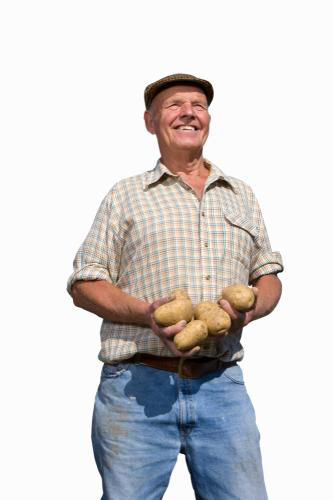

  0%|          | 30/21377 [00:29<3:38:25,  1.63it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][misc]Studio cutout of car mechanic with air hammer on white background smiling at camera[cosHint lv3][diffHint lv2][medical]cutout Of Senior Male Doctor Wearing White Coat[cosHint lv3][diffHint lv2][office]cutout Of Male Tailor[cosHint lv3][diffHint lv3][office]cutout Of Middle Aged Male Executive Wearing Suit[shot_style]cutout Of  | cutout Of  | cutout Of  | Cut Out Of  | [Location][NULL]
['cutout Of Middle Aged Male Executive Wearing White Coat']


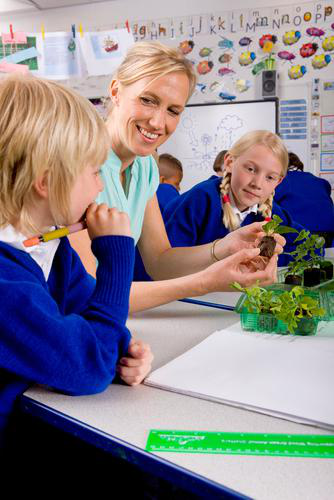

  0%|          | 31/21377 [00:30<4:14:58,  1.40it/s]

 what does the image describe?[cosHint lv3][diffHint lv2][indoors]A school teacher with blonde hair working on a microscope while teaching her students in science laboratory[cosHint lv3][diffHint lv1][indoors]Female student making notes on plant seedlings in science class smiling at camera[cosHint lv3][diffHint lv1][indoors]High school girls assembling a robotic structure in a science class with a classmate watching them[cosHint lv3][diffHint lv1][indoors]Portrait shot of a middle school student sitting in a classroom and looking at the camera with her classmates in the background[shot_style]A vertical view of | A front view of | A wide angle shot of | [Location][NULL]
['A vertical view of a science class with Teacher practically explaining students about Solar panels on a soft background of whiteboard and colorful charts']


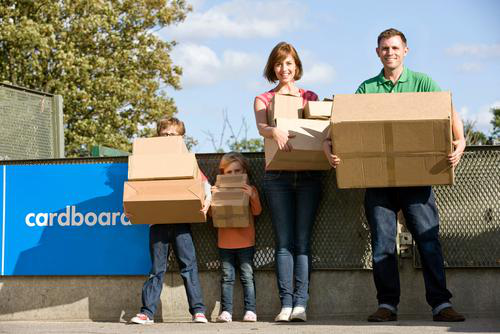

  0%|          | 32/21377 [00:31<4:27:58,  1.33it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][misc]A family moving into a new home[cosHint lv1][diffHint lv1][outdoors]A wide shot of a happy family standing together and smiling at camera with a large solar panel in background[cosHint lv1][diffHint lv1][misc]A son helping his father recycle cardboard boxes[cosHint lv1][diffHint lv1][outdoors]A full length vertical shot of a Truck driver holding a delivery package on a sunny day with a semi truck standing in the background[shot_style][NULL][Location][NULL]
['A family moving into a new home']


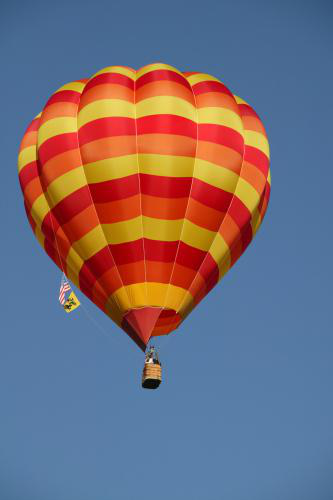

  0%|          | 33/21377 [00:32<4:18:25,  1.38it/s]

 what does the image describe?[cosHint lv4][diffHint lv2][outdoors]Low angle view of a colorful hot air balloon against blue sky Balloon Festival Albuquerque New Mexico USA[cosHint lv4][diffHint lv3][outdoors]View of a hot air balloon against blue sky Balloon Festival Albuquerque New Mexico USA[cosHint lv4][diffHint lv2][outdoors]Low angle view of hot air balloons against blue sky Balloon Festival Albuquerque New Mexico USA[cosHint lv4][diffHint lv2][outdoors]Low angle view of a colorful hot air balloon against blue sky Balloon Festival Albuquerque New Mexico USA[shot_style]View of | View of | View of | Detail toned view of | [Location][diffHint lv3][outdoors]Balloon Festival Albuquerque New Mexico USA | [diffHint lv3][outdoors]Balloon Festival Albuquerque New Mexico USA | [diffHint lv3][outdoors]Balloon Festival Albuquerque New Mexico USA | 
['View of a colorful hot air balloon against blue sky Balloon Festival Albuquerque New Mexico USA']


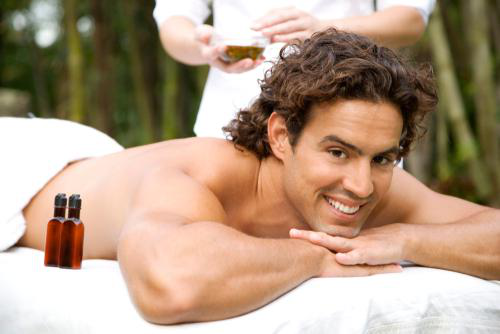

  0%|          | 34/21377 [00:32<4:09:13,  1.43it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][indoors]Horizontal overhead shot of a bare chested man having beauty treatment holding cucumber slices smiles at the camera[cosHint lv1][diffHint lv1][misc]A young woman lying on a massage table under a tree in blossom eyes closed[cosHint lv1][diffHint lv1][misc]Portrait of a young woman[cosHint lv1][diffHint lv1][indoors]Portrait of mature woman in pajamas lying on bed at home[shot_style][NULL][Location][NULL]
['A young man lying on a massage table with a bottle of essential oil']


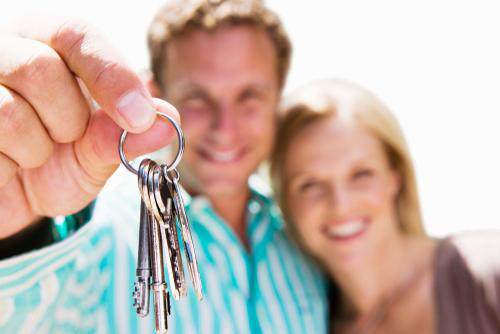

  0%|          | 35/21377 [00:33<3:54:31,  1.52it/s]

 what does the image describe?[cosHint lv2][diffHint lv1][misc]A happy couple holding keys with selective focus on the keys[cosHint lv1][diffHint lv1][outdoors]Senior couple embracing against a white curtain[cosHint lv1][diffHint lv1][indoors]Designers by drawing board looking at book together at camera[cosHint lv1][diffHint lv1][indoors]Senior man moving in holding keys to new home[shot_style]portrait cutout  | view portrait cutout of | [Location][diffHint lv2][misc]Western Cape In South Africa | 
['Man holding keys with selective focus on the keys']


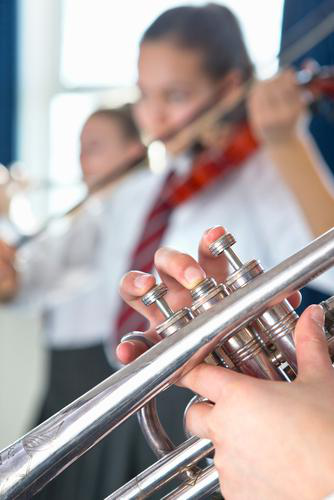

  0%|          | 36/21377 [00:34<3:59:00,  1.49it/s]

 what does the image describe?[cosHint lv1][diffHint lv3][indoors]High school student reading sheet music and playing a violin in a music class[cosHint lv1][diffHint lv3][indoors]High school student reading sheet music and playing a saxophone with a music teacher playing piano in the foreground[cosHint lv1][diffHint lv1][outdoors]Man playing the sitar Agra India South Asia[cosHint lv1][diffHint lv1][misc]Smiling high school student cooking pasta in home economics class[shot_style]Vertical shot of | [Location][NULL]
['High school student reading sheet music and playing a violin in a music class']


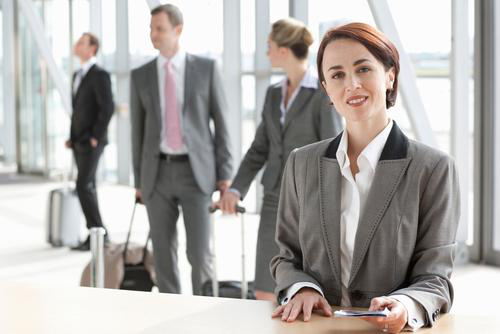

  0%|          | 37/21377 [00:34<4:14:26,  1.40it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][office]Portrait of a young businesswoman[cosHint lv3][diffHint lv1][misc]Male and female business colleagues chatting in office building[cosHint lv3][diffHint lv1][office]Businesswoman at camera with office colleagues meeting in background[cosHint lv3][diffHint lv1][indoors]A portrait of a confident businesswoman having a meeting with her co workers in the conference room[shot_style]A portrait shot of | A medium shot of | A vertical shot of | A portrait shot of | [Location][NULL]
['A portrait shot of a businesswoman smiling at camera with her colleagues walking hand in hand in the background']


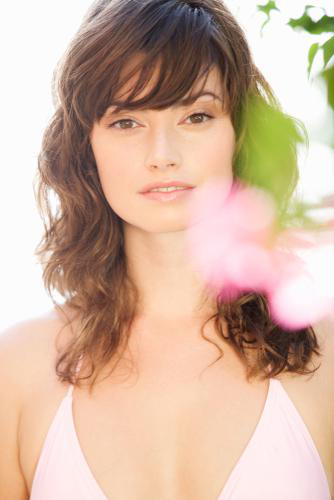

  0%|          | 38/21377 [00:35<3:56:36,  1.50it/s]

 what does the image describe?[cosHint lv2][diffHint lv1][misc]A portrait of a young blonde woman[cosHint lv2][diffHint lv1][outdoors]Portrait of a smiling woman[cosHint lv2][diffHint lv1][outdoors]Portrait of a woman Close up[cosHint lv2][diffHint lv1][outdoors]portrait woman standing in tropical garden[shot_style]Portrait of | Cropped portrait of | [Location][NULL]
['Portrait of a woman dressed in a white wraparound top']


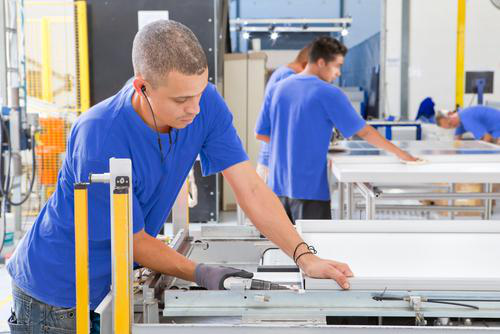

  0%|          | 39/21377 [00:36<4:19:20,  1.37it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][office]A side profile close up shot of a happy metalworker using a drill in a workshop[cosHint lv3][diffHint lv1][office]Vertical shot of a technician holding a tray of aluminum products in a hi tech manufacturing plant[cosHint lv3][diffHint lv1][office]A portrait shot of a young girl sawing wood in a vise machine in a classroom[cosHint lv3][diffHint lv1][office]Portrait of Technician worker smiling at camera in solar panel factory[shot_style]Wide shot of | [Location][NULL]
['Medium shot of a metalworker sawing wood in a vise machine in a classroom']


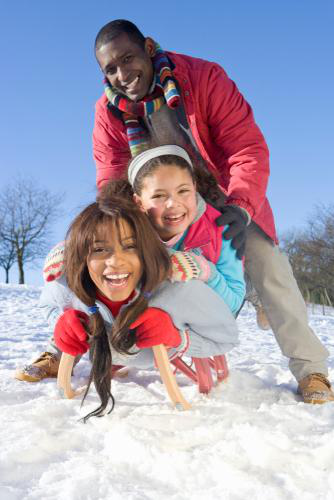

  0%|          | 40/21377 [00:36<4:00:26,  1.48it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][outdoors]Little boy and girl making snowballs in a snow field while smiling at the camera with their parents in the background[cosHint lv2][diffHint lv1][outdoors]Teenagers having snowball fight on skiing holiday Tirol Austria Europe[cosHint lv2][diffHint lv1][outdoors]Family of four with two children smiling for a picture while sledding on snow with the boy holding a snowball in his hands[cosHint lv2][diffHint lv1][outdoors]Children pulling parents on sled on family winter vacation at camera[shot_style][NULL][Location][NULL]
['Children on sled in snow on winter vacation at camera']


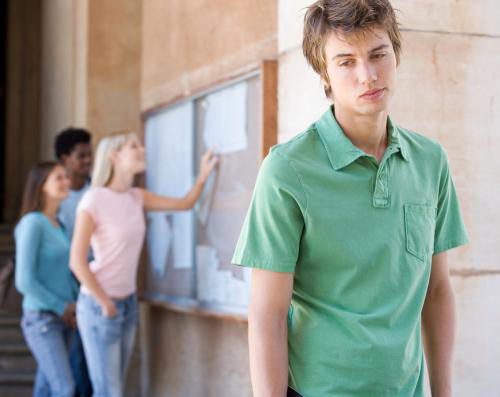

  0%|          | 41/21377 [00:37<3:55:43,  1.51it/s]

 what does the image describe?[cosHint lv4][diffHint lv2][misc]A student disappointed by his exam results[cosHint lv2][diffHint lv1][office]A confident young businesswoman is looking straight at the camera with copy space[cosHint lv1][diffHint lv1][misc]A medium shot of a businessman standing in office doorway with businesswomen walking in corridor in background[cosHint lv1][diffHint lv1][office]Young businessman in busy office looking at camera[shot_style][NULL][Location][NULL]
['A student disappointed by his exam results']


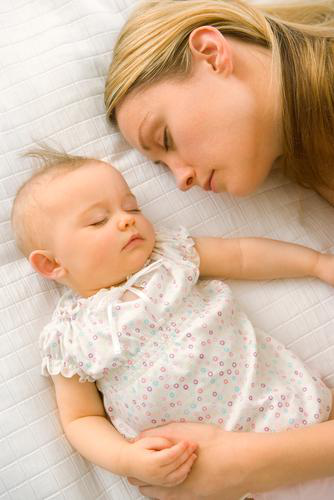

  0%|          | 42/21377 [00:38<4:02:23,  1.47it/s]

 what does the image describe?[cosHint lv2][diffHint lv1][misc]Close up of infant girl sleeping[cosHint lv1][diffHint lv1][indoors]Detail of cute baby boy lying on towel[cosHint lv1][diffHint lv3][indoors]Close up of a baby girl being fed milk from the bottle by her mother[cosHint lv1][diffHint lv1][misc]Vertical portrait of a seated baby boy in sleeping suit smiles at the camera[shot_style]Horizontal shot of | Vertical shot of | [Location][NULL]
['Horizontal head and shoulder portrait of a baby girl being fed milk from the bottle by her mother']


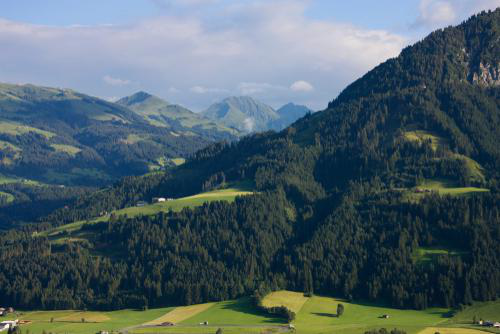

  0%|          | 43/21377 [00:38<4:00:59,  1.48it/s]

 what does the image describe?[cosHint lv4][diffHint lv1][outdoors]View to Prattigau near Davos Grisons Switzerland[cosHint lv4][diffHint lv1][outdoors]View to Sertigtal Davos Grisons Switzerland[cosHint lv4][diffHint lv1][misc]Ramosch Lower Engadine Grisons Switzerland[cosHint lv4][diffHint lv1][outdoors]View from Luesener Alm Dolomite Alps Alps South Tyrol Italy[shot_style]View from | View to | View to | Close up of | [Location][diffHint lv3][outdoors]Grisons Switzerland | [diffHint lv3][outdoors]Forte Falcone Portoferraio Island of Elba Province of Livorno Tuscany Italy | [diffHint lv3][outdoors]Forte Falcone Portoferraio Island of Elba Province of Livorno Tuscany Italy | 
['View to Sertigtal Davos Grisons Switzerland']


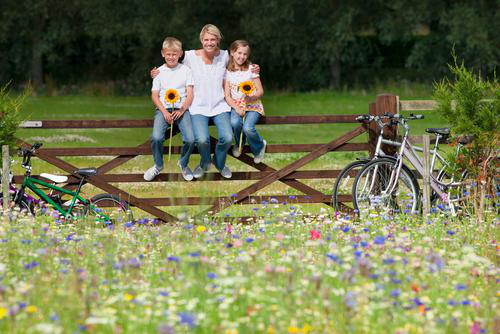

  0%|          | 44/21377 [00:39<4:39:02,  1.27it/s]

 what does the image describe?[cosHint lv4][diffHint lv3][misc]A wide shot of a happy family sitting on a fence and looking at sunflowers in a wildflower field with bicycles kept on a side[cosHint lv3][diffHint lv2][misc]A wide shot of a happy family sitting on a fence with bicycles on the side in a wildflower field[cosHint lv1][diffHint lv3][outdoors]A vertical shot of a happy blonde woman pointing and showing something to her husband while standing in a wildflower field with bicycles[cosHint lv1][diffHint lv2][misc]A vertical shot of a happy family smiling at camera while riding bicycles in a wildflower field[shot_style]A portrait shot of | A medium shot of | A medium shot of | A side profile medium shot of | [Location][NULL]
['A wide shot of a happy family sitting on a fence with bicycles on the side in a wildflower field']


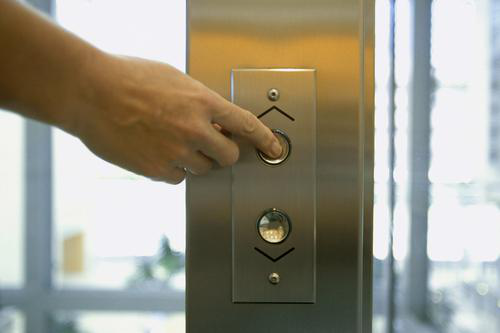

  0%|          | 45/21377 [00:40<4:09:35,  1.42it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][indoors]Senior man moving in holding keys to new home[cosHint lv1][diffHint lv1][office]A businesswoman using a laptop[cosHint lv1][diffHint lv1][office]A businesswoman using a laptop[cosHint lv1][diffHint lv1][office]A businessman ringing a bell for attention[shot_style]View of | View of | View of | View of | [Location][NULL]
['View of a woman ringing a bell for attention']


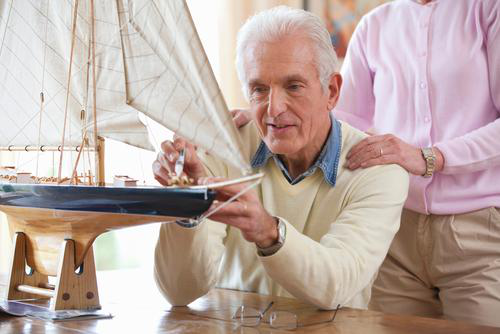

  0%|          | 46/21377 [00:41<4:23:10,  1.35it/s]

 what does the image describe?[cosHint lv3][diffHint lv3][indoors]Horizontal shot of a senior man applying glue to a model sailboat indoors[cosHint lv1][diffHint lv3][medical]Horizontal shot of a senior man assembling a jigsaw puzzle at the table encouraged by a standing home caregiver besides[cosHint lv1][diffHint lv1][electronics]Woman holding a cup of coffee and working on a laptop[cosHint lv1][diffHint lv1][food]Vertical shot of two elderly women having lunch and drinking from wine glasses at the patio table[shot_style]Horizontal shot of | Horizontal shot of | Horizontal full length profile shot of | A medium shot of | [Location][NULL]
['Horizontal shot of a senior man applying glue to a model sailboat indoors with copy space']


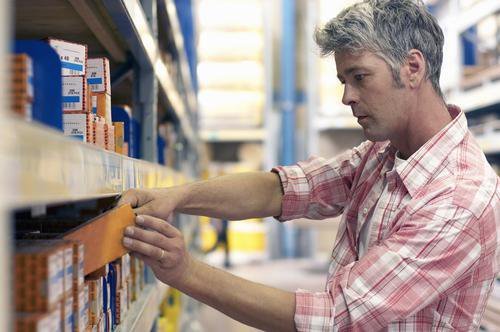

  0%|          | 47/21377 [00:41<4:04:27,  1.45it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][office]Vertical wide shot of a worker with clipboard standing next to a pallet of cardboard boxes wrapped in plastic at a distribution warehouse[cosHint lv3][diffHint lv1][office]Low angle vertical shot of a supervisor inspecting boxes at the production line of a distribution warehouse[cosHint lv3][diffHint lv1][office]Worker In Solar Panel Manufacturing Warehouse[cosHint lv2][diffHint lv1][office]Vertical portrait of a worker smiling at the camera while packing boxes at the production line of a distribution warehouse[shot_style][NULL][Location][NULL]
['Male Worker checking boxes at the production line of a distribution warehouse']


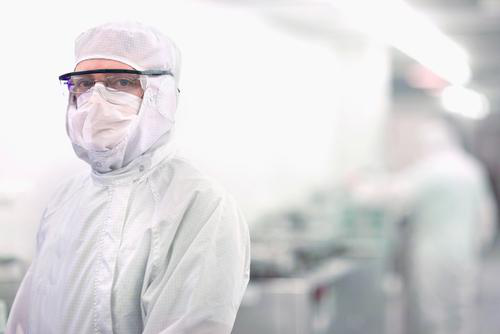

  0%|          | 48/21377 [00:42<4:16:53,  1.38it/s]

 what does the image describe?[cosHint lv3][diffHint lv3][office]A horizontal view of a scientist in lab suit examining a silicon wafer under the microscope in a clean room laboratory with selective focus[cosHint lv3][diffHint lv3][office]Scientists in clean suits cautiously working in a silicon wafer manufacturing laboratory[cosHint lv3][diffHint lv1][office]Scientists in clean suits discussing paperwork in silicon wafer manufacturing laboratory[cosHint lv3][diffHint lv3][office]A frontal Close up portrait of an expert scientist in a clean suit[shot_style]A portrait of | A horizontal portrait of | A horizontal view of | [Location][NULL]
['A frontal Close up portrait of an expert scientist in a clean suit']


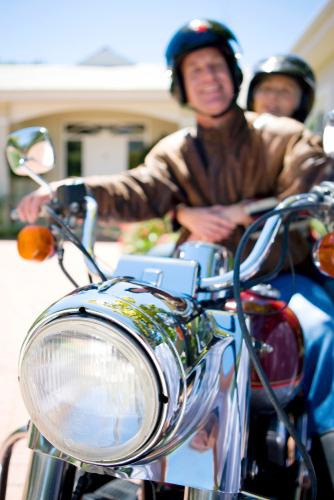

  0%|          | 49/21377 [00:43<3:53:31,  1.52it/s]

 what does the image describe?[cosHint lv2][diffHint lv1][misc]Front view portrait of a smiling young man leaning against a red motorbike on the driveway[cosHint lv1][diffHint lv1][outdoors]Senior man riding touring motorbike outdoors smiling at camera[cosHint lv1][diffHint lv1][outdoors]A senior man riding a motorbike[cosHint lv1][diffHint lv1][outdoors]Senior couple riding motorcycle in rural area[shot_style][NULL][Location][NULL]
['Couple riding motorcycle in driveway']


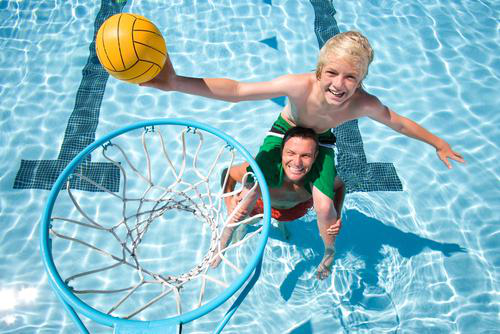

  0%|          | 50/21377 [00:44<4:22:59,  1.35it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][indoors]Low angle shot of high school students playing basketball during a gym class[cosHint lv1][diffHint lv1][misc]A teenage girl having fun by a swimming pool[cosHint lv1][diffHint lv1][misc]A young woman in a swimming pool[cosHint lv1][diffHint lv1][outdoors]Underwater view of woman wearing goggles in swimming pool at camera[shot_style]Vertical portrait of | Low angle view of | Elevated view of | Full length shot of | [Location][NULL]
['Overhead shot of a high school boy and his teacher playing basketball in a gym glass']


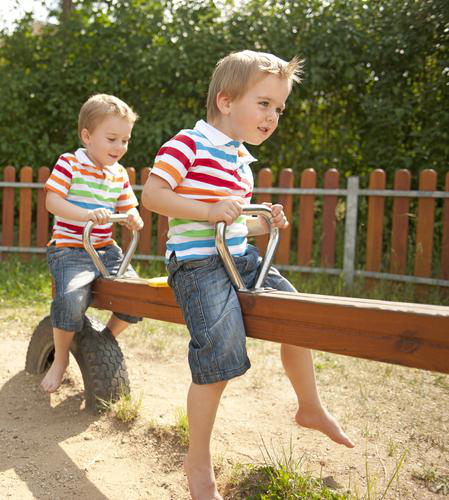

  0%|          | 51/21377 [00:44<3:58:19,  1.49it/s]

 what does the image describe?[cosHint lv2][diffHint lv3][outdoors]Twin brothers climbing on ropes in playground[cosHint lv2][diffHint lv3][outdoors]Twin brothers playing in sandpit with toy cars[cosHint lv1][diffHint lv1][outdoors]Children playing on a carousel in a park[cosHint lv1][diffHint lv3][outdoors]Twin blowing bubbles at brother in park[shot_style]portrait | [Location][NULL]
['Twin brothers climbing on ropes in playground']


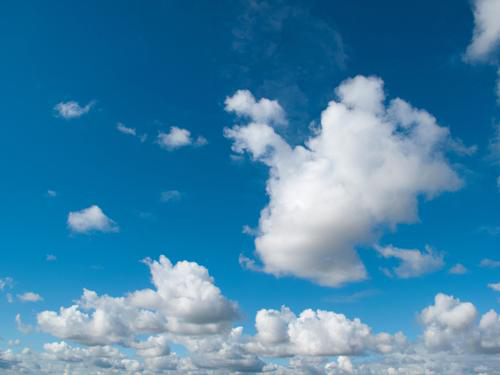

  0%|          | 52/21377 [00:45<3:37:22,  1.64it/s]

 what does the image describe?[cosHint lv4][diffHint lv1][outdoors]White Clouds Against Blue Summer Sky[cosHint lv4][diffHint lv1][outdoors]Clouds floating in blue sky[cosHint lv4][diffHint lv1][outdoors]Horizontal shot of summer bright blue sky with fluffy clouds[cosHint lv4][diffHint lv1][outdoors]Clouds in blue sky[shot_style]Vertical shot of | Vertical shot of | [Location][NULL]
['Horizontal shot of summer bright blue sky with fluffy clouds']


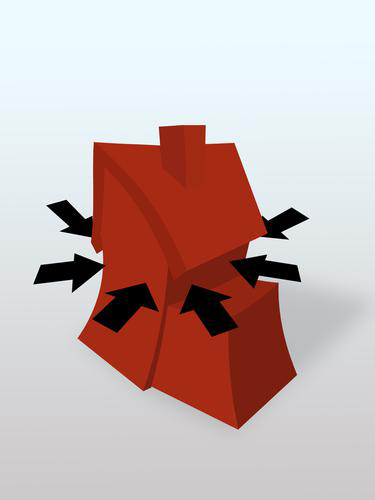

  0%|          | 53/21377 [00:45<3:31:49,  1.68it/s]

 what does the image describe?[cosHint lv2][diffHint lv2][misc]Arrows squeezing British pound symbol[cosHint lv2][diffHint lv1][misc]Overhead shot of a group of people holding black umbrellas with one pink umbrella in between[cosHint lv1][diffHint lv1][misc]Slowly rotating LED light bulb created in 3D 3D illustration Background used for presentation on energy climate change and new technologies[cosHint lv1][diffHint lv1][electronics]Highly detailed 3D concept of a stock market crash monitored on a tablet showing bar graphs numbers and arrows[shot_style][NULL][Location][NULL]
['Arrows squeezing British pound symbol']


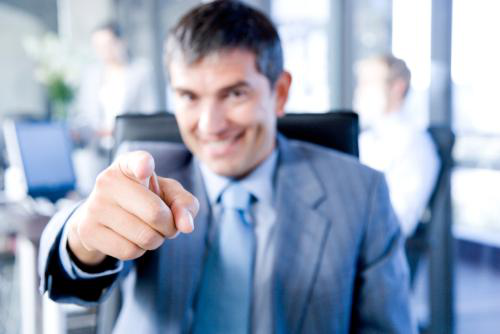

  0%|          | 54/21377 [00:46<3:27:50,  1.71it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][indoors]A portrait of a young adult Businesswoman in formal suit sitting at a table in the office lobby while using a laptop[cosHint lv3][diffHint lv1][indoors]A horizontal portrait of a smiling businessman in formal suit sitting at the table with a laptop in an office lobby[cosHint lv3][diffHint lv1][misc]Male and female business colleagues chatting in office building[cosHint lv3][diffHint lv1][indoors]A portrait of a confident businesswoman having a meeting with her co workers in the conference room[shot_style][NULL][Location][NULL]
['Businessman pointing at the camera and smiling']


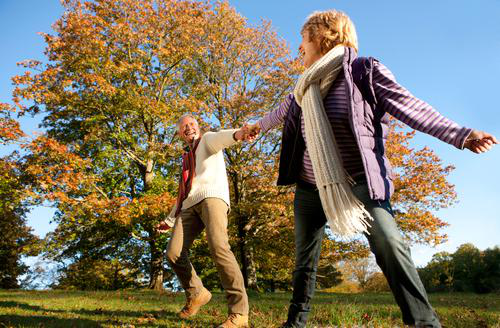

  0%|          | 55/21377 [00:47<3:51:35,  1.53it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][misc]A low angle portrait shot of a happy senior man pulling his wife's hand while walking in an autumn park[cosHint lv3][diffHint lv1][outdoors]Loving senior couple holding hands on walk through autumn countryside[cosHint lv2][diffHint lv1][misc]A low angle shot of happy senior man pulling his wife's hand in an autumn park with a big tree in background[cosHint lv2][diffHint lv1][outdoors]Horizontal low angle waist up shot of a joyous senior couple embracing in the garden during autumn[shot_style]A shot of | A portrait Close up shot of | A portrait shot of | A Close up vertical shot of | [Location][NULL]
["A low angle shot of happy senior man pulling his wife's hand while walking in an autumn park"]


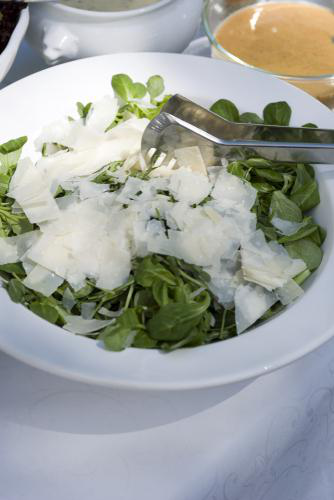

  0%|          | 56/21377 [00:47<4:00:22,  1.48it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][misc]High angle view of tea leaves being strained into tea[cosHint lv1][diffHint lv1][outdoors]Moldy old pretzel in lunchbox Woerthsee Bavaria Germany[cosHint lv1][diffHint lv1][indoors]Close up of whipped cream on cup of hot chocolate on cafe table with focus on foreground[cosHint lv1][diffHint lv1][food]Close up of blocks of cheese under cloth[shot_style]Low angle view of | [Location][NULL]
['High angle view of whipped cream on cup of hot chocolate on cafe table with focus on foreground']


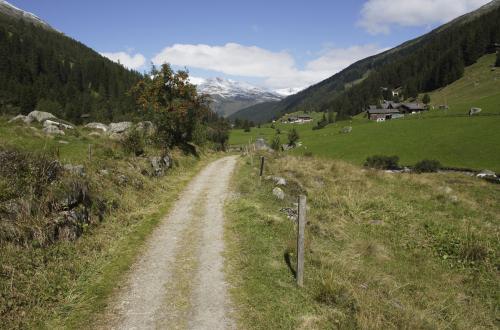

  0%|          | 57/21377 [00:48<4:57:15,  1.20it/s]

 what does the image describe?[cosHint lv4][diffHint lv1][outdoors]View to Sertigtal Davos Grisons Switzerland[cosHint lv3][diffHint lv3][outdoors]Scenic view of Dischma Brook view into Dischma Valley Davos Graubuenden Grisons Switzerland[cosHint lv3][diffHint lv3][outdoors]Scenic view of Dischma Brook view into Dischma Valley Davos Graubuenden Grisons Switzerland[cosHint lv3][diffHint lv3][outdoors]Dirt road next to Dischma Brook view out of Dischma Valley Davos Graubuenden Grisons Switzerland[shot_style]Panoramic view of | Scenic view of | Scenic view of | [Location][diffHint lv3][outdoors]Dischma Valley Davos Graubuenden Grisons Switzerland | [diffHint lv3][outdoors]Ammersee with boats Herrsching Bavaria Germany | [diffHint lv3][outdoors]Dischma Brook view into Dischma Valley Davos Graubuenden Grisons Switzerland | [diffHint lv3][outdoors]Dischma Brook view into Dischma Valley Davos Graubuenden Grisons Switzerland | [diffHint lv3][outdoors]Sertig Valley Davos Graubuenden Grisons Swi

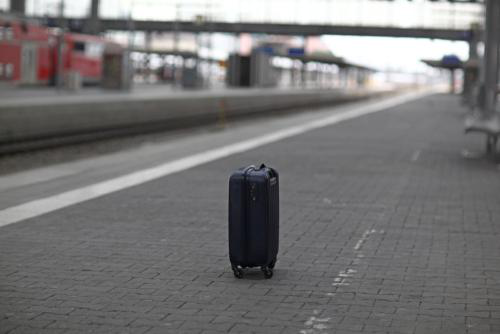

  0%|          | 58/21377 [00:49<4:21:31,  1.36it/s]

 what does the image describe?[cosHint lv3][diffHint lv3][outdoors]Empty railway station platform Munich Bavaria Germany Europe[cosHint lv1][diffHint lv1][office]A businessman pulling suitcase along[cosHint lv1][diffHint lv1][indoors]A medium shot a happy senior couple smiling at each other while entering an airport through automatic doors with a luggage trolley bag[cosHint lv1][diffHint lv1][office]Businessman with suitcase talking to businessman in cubicle[shot_style][NULL][Location][diffHint lv3][outdoors]Munich Bavaria Germany Europe | [diffHint lv2][outdoors]Lake Starnberg Bavaria Germany Europe | [diffHint lv2][outdoors]Lake Starnberg Bavaria Germany Europe | [diffHint lv2][outdoors]Lake Starnberg Bavaria Germany Europe | [diffHint lv2][outdoors]Karwendel mountains Garmisch Partenkirchen Bavaria Germany Europe | 
['Empty railway station platform Munich Bavaria Germany Europe']


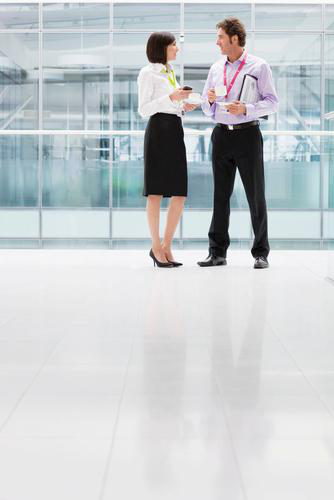

  0%|          | 59/21377 [00:50<4:20:34,  1.36it/s]

 what does the image describe?[cosHint lv4][diffHint lv1][office]Horizontal shot of a group of business people walking and pulling suitcases in the airport on their way to the departure gate[cosHint lv4][diffHint lv1][indoors]A letting agent showing businesswoman around an empty office[cosHint lv3][diffHint lv1][office]Middle aged businesswoman walking and pulling a suitcase in the airport lobby[cosHint lv3][diffHint lv1][indoors]A rear view of a Pensive businessman looking out through a glass window in a conference room[shot_style]A medium shot of | A medium shot of | A portrait shot of | A portrait shot of | [Location][NULL]
['A medium shot of a businessman and businesswoman talking with each other while drinking coffee in office']


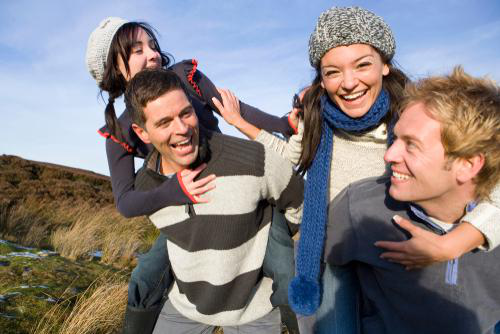

  0%|          | 60/21377 [00:50<4:00:55,  1.47it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][outdoors]Portrait of happy family standing next to a white car with ocean in the background[cosHint lv1][diffHint lv1][outdoors]Horizontal shot of a mature couple sitting atop a rock overlooking the Atlantic ocean on a sunny day with copy space[cosHint lv1][diffHint lv1][outdoors]Portrait of children pushing wheelbarrow full of autumn leaves[cosHint lv1][diffHint lv1][outdoors]Man carrying smiling woman through dunes on summer beach vacation[shot_style][NULL][Location][NULL]
['Family on winter vacation sitting on sled on mountain top smiling at camera']


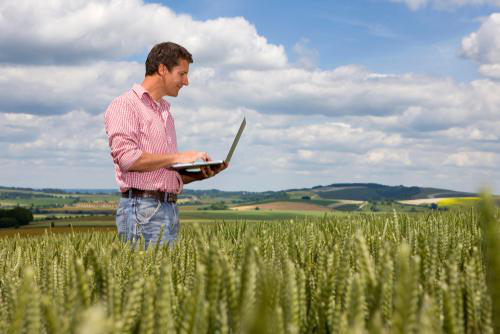

  0%|          | 61/21377 [00:51<3:30:28,  1.69it/s]

 what does the image describe?[cosHint lv4][diffHint lv1][animals]Back shot of a farmer with a digital tablet standing in the barley crop field in summer[cosHint lv4][diffHint lv1][electronics]A low angle portrait shot of a businessman standing in a wheat field and using his laptop[cosHint lv3][diffHint lv1][animals]Close up of a farmer using a digital tablet in the sunny rural barley crop field in summer[cosHint lv3][diffHint lv1][outdoors]Close up shot of a farmer examining crop in barley crop field in summer[shot_style]Portrait Of  | Portrait Of  | Portrait Of  | [Location][NULL]
['Mature farmer using laptop in countryside']


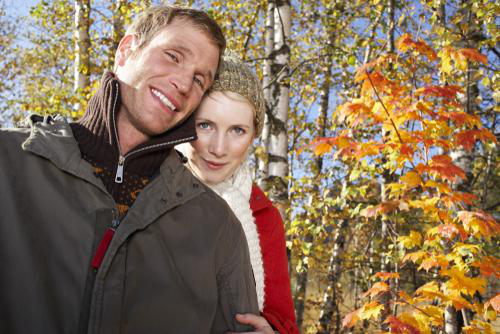

  0%|          | 62/21377 [00:51<3:23:10,  1.75it/s]

 what does the image describe?[cosHint lv1][diffHint lv3][outdoors]Senior biker couple smiling with motorcycle and mountains in background[cosHint lv1][diffHint lv1][outdoors]Smiling senior man in scarf and hooded top in autumn countryside[cosHint lv1][diffHint lv1][outdoors]Senior couple hugging in snowy landscape[cosHint lv1][diffHint lv1][outdoors]A small family of three sitting on a cold beach in front of tall grass while smiling at the camera[shot_style]Close up of | [Location][NULL]
['Smiling couple on walk in autumn countryside smiling at camera']


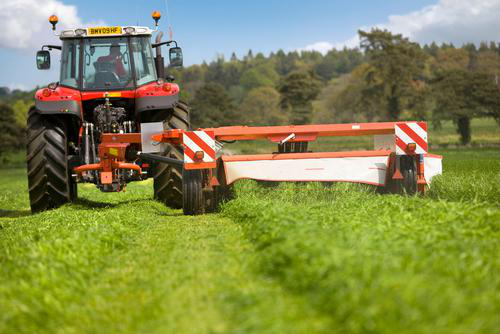

  0%|          | 63/21377 [00:52<4:22:42,  1.35it/s]

 what does the image describe?[cosHint lv4][diffHint lv2][office]A front view of a red tractor in selective leaving behind the tracks of grass in stripe pattern in the background while mowing the field for silage[cosHint lv3][diffHint lv1][outdoors]Combine harvester emptying harvested wheat grain into tractor trailer[cosHint lv3][diffHint lv1][office]Tractor attached to a baling machine running over a straw field at a rural farm[cosHint lv3][diffHint lv1][office]Tractor with a straw baling machine at a rural field[shot_style]selective focus of  | selective focus of  | Close up of | A wide shot of | [Location][NULL]
['A front view of a red tractor in selective leaving behind the tracks of grass in stripe pattern in the background while mowing the field for silage']


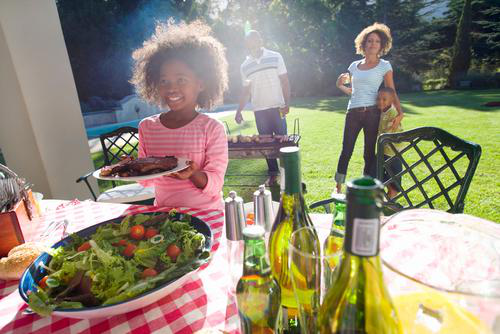

  0%|          | 64/21377 [00:53<4:39:16,  1.27it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][food]Horizontal three quarter length shot of a woman having strawberries in breakfast smiles at the camera[cosHint lv1][diffHint lv1][food]Two women having lunch and drinking wine at the table and smiling[cosHint lv1][diffHint lv1][food]Corn on cob and kebabs on table at backyard barbecue[cosHint lv1][diffHint lv1][misc]A family sitting down for Christmas dinner[shot_style]Horizontal low angle shot of | Horizontal head and shoulder profile shot of | Horizontal waist up portrait of | Horizontal head and shoulder profile shot of | [Location][NULL]
['Horizontal low angle shot of a joyous senior couple having strawberries in breakfast smiles at the camera']


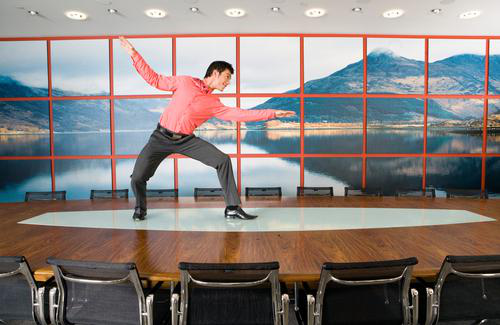

  0%|          | 65/21377 [00:54<4:55:41,  1.20it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][misc]High school student wearing school uniform in school gymnasium[cosHint lv1][diffHint lv1][food]Two businessman playing football in an empty office[cosHint lv1][diffHint lv3][office]Vertical shot of a businessman doing a handstand on board desk in a meeting room as colleagues watch on[cosHint lv1][diffHint lv1][office]Vertical shot of a woman holding a set of paper sheets stands beside a white board and some chairs[shot_style]Vertical shot of | Horizontal shot of | Vertical shot of | Horizontal profile shot of | [Location][NULL]
['Vertical shot of a businessman doing a handstand on board desk in a meeting room as colleagues watch on']


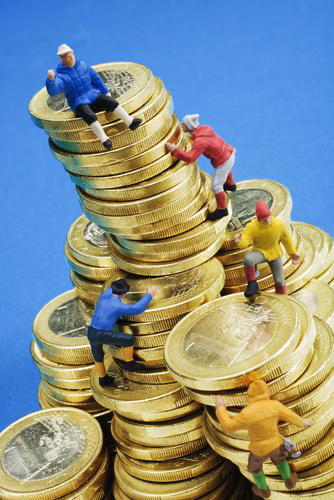

  0%|          | 66/21377 [00:55<4:09:42,  1.42it/s]

 what does the image describe?[cosHint lv2][diffHint lv1][office]Businessman figurine on pile of Euro coins[cosHint lv2][diffHint lv1][office]Businessman figurine on stack of Euro coins[cosHint lv2][diffHint lv1][misc]Stacks of assorted Euro coins[cosHint lv1][diffHint lv1][misc]Stacks of assorted Euro coins[shot_style][NULL][Location][NULL]
['Stacks of assorted Euro coins']


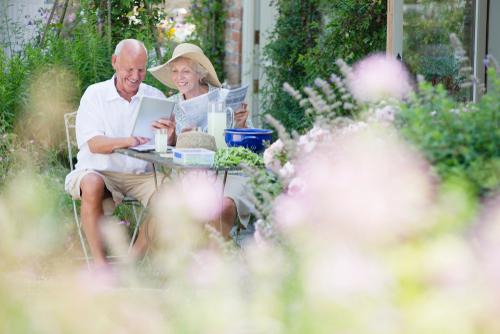

  0%|          | 67/21377 [00:55<3:49:49,  1.55it/s]

 what does the image describe?[cosHint lv2][diffHint lv1][outdoors]Elderly couple sitting in garden slicing apples[cosHint lv2][diffHint lv2][misc]Senior Man Asleep In Vegetable Garden[cosHint lv1][diffHint lv2][misc]Senior Couple Working In Beautiful Cottage Flower Garden[cosHint lv1][diffHint lv1][misc]A medium shot of a happy senior couple smiling at camera while eating strawberries in a field of wildflowers[shot_style]Close up Of  | [Location][NULL]
['Senior Man Asleep In Vegetable Garden']


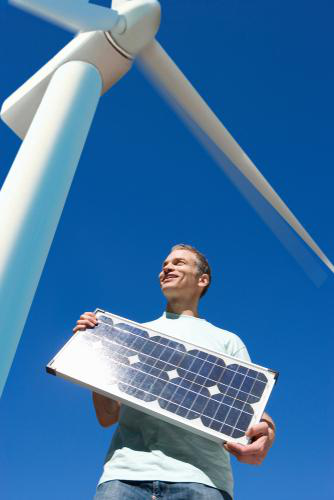

  0%|          | 68/21377 [00:56<3:57:47,  1.49it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][misc]A vertical shot of an engineer standing near large solar panels[cosHint lv3][diffHint lv1][office]Vertical shot of two workers in hard hats holding solar panel beneath a wind turbine on a bright sunny day[cosHint lv3][diffHint lv1][outdoors]Low angle view of windmill against blue sky[cosHint lv2][diffHint lv1][misc]A vertical Close up shot of a large solar panel with an engineer standing in background[shot_style][NULL][Location][NULL]
['Vertical shot of a technician holding solar panel beneath a wind turbine on a bright sunny day']


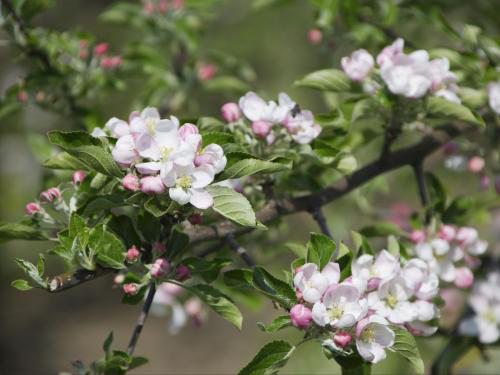

  0%|          | 69/21377 [00:56<3:29:17,  1.70it/s]

 what does the image describe?[cosHint lv4][diffHint lv3][outdoors]Close up of apple blossoms outdoors[cosHint lv4][diffHint lv3][outdoors]Close up of pear blossoms outdoors[cosHint lv3][diffHint lv3][outdoors]Close up of pear blossoms outdoors[cosHint lv3][diffHint lv1][food]Kiwi fruits hanging on tree North Island New Zealand[shot_style]Close up of | Close up of | Close up of | Close up of | [Location][NULL]
['Close up of apple blossoms outdoors']


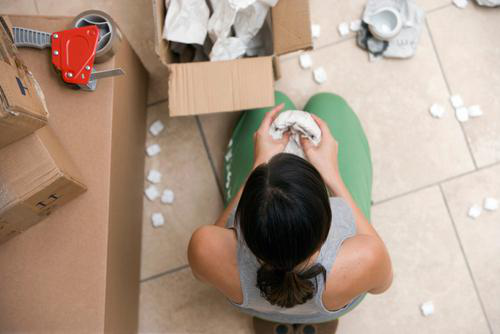

  0%|          | 70/21377 [00:57<3:51:47,  1.53it/s]

 what does the image describe?[cosHint lv1][diffHint lv1][indoors]Woman decorating at home painting wall with paint roller smiling side view[cosHint lv1][diffHint lv1][indoors]Mid length shot of a mature woman holding aloft set of keys to a new house with a senior man carrying rolled up carpet and lamp in the background[cosHint lv1][diffHint lv1][indoors]Horizontal shot of a happy young woman moving mattress with copy space[cosHint lv1][diffHint lv1][office]Male Brewery Worker Checking Fermentation Process In Steel Vat[shot_style]elevated view of | Close up of  | [Location][NULL]
['High angle view of couple moving in at home painting wall with test swatches holding paintbrush dipped in red paint']


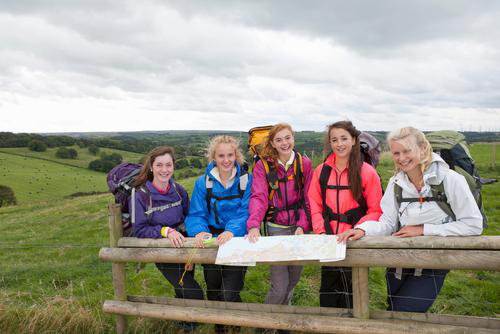

  0%|          | 71/21377 [00:58<4:18:00,  1.38it/s]

 what does the image describe?[cosHint lv4][diffHint lv3][outdoors]A group of girls with backpacks looking at a map and compass over a wooden fence in a green field[cosHint lv4][diffHint lv3][outdoors]High angle shot of the backside of a group of girls with backpacks sitting on a fence in a green field[cosHint lv3][diffHint lv3][outdoors]High angle shot of a group of girls with backpacks looking at a map and compass over a wooden fence in a green field[cosHint lv3][diffHint lv2][outdoors]Girl with a backpack smiling at the camera while climbing over a fence in a green field with a group on friends in the background[shot_style]High angle shot of | Medium shot of | High angle shot of | [Location][NULL]
['A group of girls with backpacks looking at a map and compass over a wooden fence in a green field']


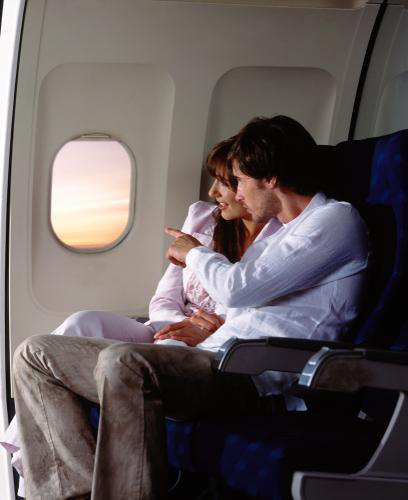

  0%|          | 72/21377 [00:58<4:03:54,  1.46it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][office]Wide shot of business employees talking while sitting in a private jet[cosHint lv3][diffHint lv1][office]A businessman and a businesswoman talking while sitting in a private jet[cosHint lv2][diffHint lv1][misc]Close up of a woman holding a champagne glass while sitting with a handsome man on the private jet[cosHint lv2][diffHint lv1][office]Smiling businessman sitting in a private jet and working on a digital tablet while talking to a colleague[shot_style][NULL][Location][NULL]
['Business employees sitting in a private jet and having a meeting']


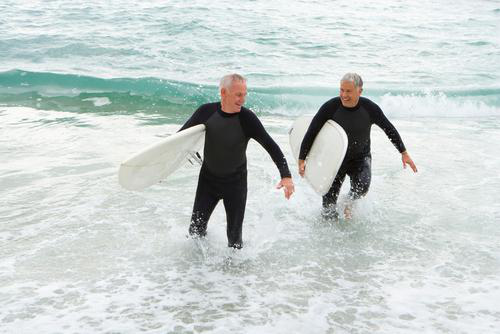

  0%|          | 73/21377 [00:59<4:13:43,  1.40it/s]

 what does the image describe?[cosHint lv3][diffHint lv1][outdoors]Vertical shot of a female surfer in a wetsuit on the beach with a surfboard[cosHint lv3][diffHint lv3][outdoors]Side view of two male surfers in wetsuits walking with a surfboard on the beach[cosHint lv3][diffHint lv1][misc]Surfer falling off surfboard on wave[cosHint lv3][diffHint lv1][misc]Vertical shot of a Surfer With a prosthetic Leg Standing On Beach holding a surfboard[shot_style]Side view of | Mid shot of | Low angle view of | Vertical shot of | [Location][NULL]
['Side view of two male surfers in wetsuits walking with a surfboard on the beach']


  0%|          | 73/21377 [01:00<4:52:42,  1.21it/s]


KeyboardInterrupt: ignored

In [8]:
#inference
from component.ofa.modeling_ofa import OFAModelForCaption, OFAModel
from component.ofa.tokenization_ofa import OFATokenizer 
from torchvision import transforms
from PIL import Image
from tqdm import tqdm
import torch
import os
import base64
from datetime import date, datetime
from io import BytesIO
import datetime
test = True

csv_path = '../OFA_huge_NICE_captioning/data/'

if test:
  image_file = f'{csv_path}test_image(need to delete backslash).tsv'  ## tsv(byte) read pictures faster than jpg 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = OFAModel.from_pretrained(inference_model).to(device)
print(inference_model)
tokenizer = OFATokenizer.from_pretrained('./vocab' )
model.eval()


mean, std = [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]
resolution = 256
patch_resize_transform = transforms.Compose([
        lambda image: image.convert("RGB"),
        transforms.Resize((resolution, resolution), interpolation=Image.BICUBIC),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean, std=std)
    ])

resultDF = pd.DataFrame(columns = ['public_id', 'caption'])

iter = 0
batch_size = 1
pic_list = []
save = 0
with open(image_file, 'r', encoding='utf8') as f:
  lines = f.readlines()
  with torch.no_grad():
    for line in tqdm(lines):
      pic_id, image_content = line.split('\t')
      
          
      if test:
        pic_id = pic_id[:-1]##didn't erase \\ at tsv

        txt = " what does the image describe?"
        txt+= caption_result[pic_id]
        
        inputs = tokenizer([txt], return_tensors="pt").input_ids.to(device)
        img = Image.open(BytesIO(base64.urlsafe_b64decode(image_content)))
        
      else:
        img = Image.open(f'{csv_path}val/{pic_id}.jpg')

      if iter == 0:
        patch_img = patch_resize_transform(img).unsqueeze(0).to(device)
        pic_list = [pic_id]
      else:
        imsi_img = patch_resize_transform(img).unsqueeze(0).to(device)
        patch_img = torch.cat((patch_img, imsi_img), dim = 0)
        pic_list.append(pic_id)
    
      iter+=1

      if iter== batch_size:## last batch size issue
        iter = 0
        gen = model.generate(inputs.repeat(batch_size,1), patch_images=patch_img, 
                            num_beams=5, no_repeat_ngram_size=3, max_length = 40
                            , use_cache=False )
        gen_sentence = tokenizer.batch_decode(gen, skip_special_tokens=True)
        
        ## erase if you want to full inference
        img.show()
        print(txt)
        print(gen_sentence)


        batch_df = pd.DataFrame(columns = ['public_id', 'caption'])
        for id,caption in zip(pic_list, gen_sentence):

          imsiSeries = pd.Series({'public_id':id, 'caption': caption})
          imsi_df = imsiSeries.to_frame().transpose()
          batch_df= pd.concat([batch_df,imsi_df],ignore_index = True)
        resultDF = pd.concat([resultDF,batch_df],ignore_index = True)

      # if save %2000 == 0:  save while inferencing
      #   resultDF.to_csv(f'../submission.csv', encoding = 'utf-8', index = False)
      # save+=1

resultDF.to_csv(f'../submission_final.csv', encoding = 'utf-8', index = False)